# Neural Style Transfer

### Importante: Para esta práctica se utilizó la imagen de las montañas y una imagen de Van Gogh para transferir estilo, dado a que la imagen que venía por defecto tenía un link roto que había que solucionar, se decidió hacerlo con otra imagen y mantener todo lo demás exactamente **igual.**

En el pdf de la actividad se describe brevemente el método de generación de imágenes **Neural Style Transfer**. No se pretende adquirir un conocimiento profundo de este método sino utilizar la práctica para adquirir un **conocimiento intuitivo de las Redes Neuronales Convolucionales como extractores de características**.

En primer lugar, importamos PyTorch junto con otros paquetes.

In [ ]:
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

## Transfer Learning: descargamos VGG19 
En esta actividad vamos a utilizar el primer bloque de VGG19, que sirve para **extraer las características** de la imagen de entrada

In [ ]:
# reutilizamos el modelo pre-entrenado VGG19
vgg_all = models.vgg19(pretrained=True)

# pero seleccionamos solo el primer bloque de la red que extrae features
vgg_features = vgg_all.features

# congelamos porque solo queremos optimizar la imagen target
for param in vgg_features.parameters():
    param.requires_grad_(False)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

## VGG19 - Clasificador
Aunque en esta práctica solo vamos a utilizar el bloque extractor de características, podemos aprovechar para echarle un vistazo al bloque de **clasificación**.

Comprobamos que el segundo bloque, el clasificador, está compuesto por:
* capas lineales (Linear)
* funciones de activación ReLU
* capas de dropout para evitar overfitting

Si quisiéramos utilizar VGG19 como clasificador de un dataset de imágenes, deberíamos sustituir este bloque por otro similar con tantas salidas como clases haya en el dataset. 

In [ ]:
vgg_classifier = vgg_all.classifier
print(vgg_classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)


## Pasamos modelo a GPU si está disponible

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg_features.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## load_image
Función para cargar una imagen

In [ ]:
def load_image(img_path, max_size=300, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= max_size pixels in the x-y dims.'''
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')
    
    # large images will slow down processing
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape

    # VGG está normalizada con los valores de Imagenet: 0.406, 0.456, 0.485 en BGR, que invertimos en RGB.
    # En rango 0-255 seria 103.94, 116.78, 123.68 en BGR
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # con :3 eliminamos el último canal de la primera dimensión, que es el alfa e indica la transparencia
    # con unsqueeze(0) añadimos como primera dimensión el batch
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

## Carga de las imágenes de contenido y estilo
Además, cambiamos tamaño de la imagen de estilo a la de contenido.

In [ ]:
# cargamos las imágenes de contenido y estilo
img_quinta = "https://github.com/albertojulian/master-ub/raw/main/quinta.jpeg"
img_palamos = "https://github.com/albertojulian/master-ub/raw/main/playa_palamos.jpg"
img_soto = "https://github.com/albertojulian/master-ub/raw/main/soto_cruz_mazo.jpg"

content = load_image(img_soto).to(device)

img_van_gogh = "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg"
img_kandinsky = "https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg"

# cambia tamaño de la imagen de estilo: coge los dos últimos valores de shape de la imagen de contenido
style = load_image(img_van_gogh, shape=content.shape[-2:]).to(device)

**Nota importante:** con la imagen guardada en la variable **img_kandinsky** arroja un error, por ello se procede a utilizar la imagen de Van Gogh en lugar de la que venía por defecto. 

## im_convert 
Es una función de ayuda para pasar una imagen de Tensor a numpy y poderla visualizar

In [ ]:
def im_convert(tensor):
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0) # cambia ancho por alto
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

## Veamos las imágenes de contenido y estilo

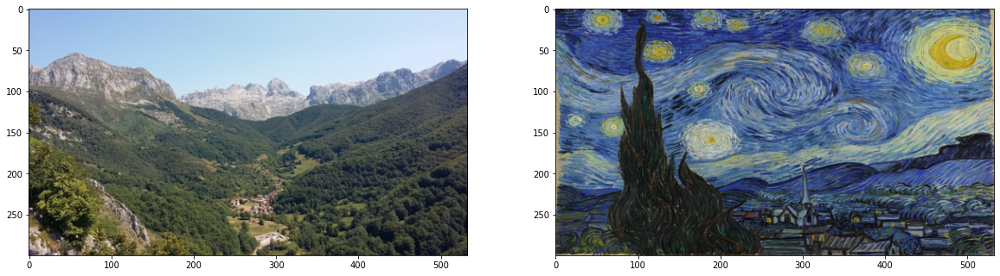

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(style))

## Capas de vgg_features
Veamos los identificadores de capas del extractor de características, vgg_features

In [ ]:
print(vgg_features)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## Extracción de características
La función get_features se utiliza para extraer las características de las imágenes de contenido y estilo.

En primer lugar, filtramos las capas que vamos a tener en cuenta para la extracción de características según se indica en el artículo de referencia. Utilizaremos varias capas para el estilo pero solo una (conv4_2) para el contenido.

A continuación, extraemos las características de la imagen para las capas seleccionadas.

In [ ]:
def get_features(image, model, layers=None):
    
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1', 
                  '10': 'conv3_1', 
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## contenido
                  '28': 'conv5_1'}

    features = {}
    x = image
    # model._modules es un diccionario con todas las capas
    for name, layer in model._modules.items():
        x = layer(x) # la imagen se va transformando en cada capa...
        if name in layers: # ...pero solo extraemos las características de las capas seleccionadas
            features[layers[name]] = x
            
    return features


## Matriz Gram
El método Style Transfer utiliza la matriz Gram o Gramian para procesar las características.

Ver https://en.wikipedia.org/wiki/Gramian_matrix 

In [ ]:
def gram_matrix(tensor):

    # obtenemos batch_size, depth, height y width del Tensor
    b, d, h, w = tensor.size()

    # convertimos el tensor a 2D multiplicando dimensiones entre sí 
    tensor = tensor.view(b * d, h * w)
    
    # calculamos la matriz gram multiplicando el tensor por su transpuesto
    gram = torch.mm(tensor, tensor.t())
    
    return gram

## Definimos los parámetros a probar
* Definimos los pesos de las capas de estilo. Excluimos conv4_2 porque es la capa de la que extraemos el contenido.
* Definimos valores de los pesos de contenido y estilo para la función de pérdida (content_weight, style_weight).
* Definimos la tasa de aprendizaje.
* Definimos el número de iteraciones (steps)


## Primer parámetro por defecto

In [ ]:
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e6  # beta

learning_rate = 0.1

steps = 500 # número de iteraciones

# definimos cada cuántas imágenes queremos hacer una visualización intermedia
show_every = 100

## Inicialización y entrenamiento del modelo
Tareas:
* definimos las capas del nuevo modelo
* inicializamos la imagen generada con la imagen de contenido
* definimos el optimizador
* modificamos la imagen generada mediante la función de pérdida, compuesta por la suma de la pérdida de estilo y la de contenido ponderadas

Pérdida total:  1124970.75


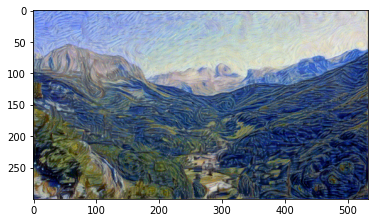

Pérdida total:  490372.40625


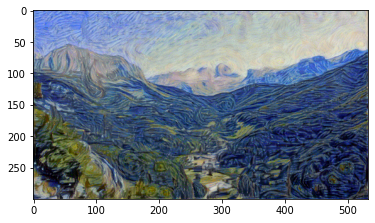

Pérdida total:  308930.9375


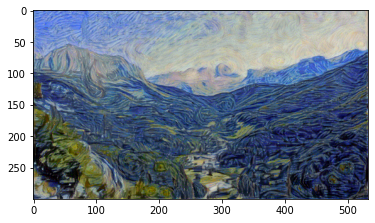

Pérdida total:  636636.0


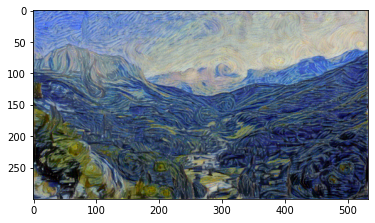

Pérdida total:  158719.328125


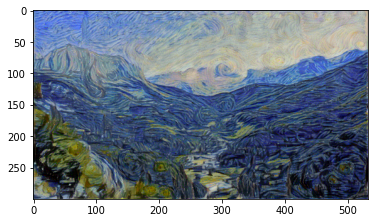

In [ ]:
# extraemos características de contenido y estilo de las imágenes originales
content_features = get_features(content, vgg_features)
style_features = get_features(style, vgg_features)

# calculamos la matriz gram de cada capa de estilo
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# creamos una tercera imagen "target" que se va a ir modificando
# La inicializamos con la imagen de contenido...
# ...y le vamos cambiando el estilo
target = content.clone().requires_grad_(True).to(device)

# definimos el optimizador sobre los parámetros de la imagen target
optimizer = optim.Adam([target], lr=learning_rate)

for ii in range(1, steps+1):
    
    # extraemos las características de la imagen generada
    target_features = get_features(target, vgg_features)
    
    # definimos la función de pérdida de contenido
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # definimos la función de pérdida de estilo como suma de la pérdida de cada capa
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        style_gram = style_grams[layer]
        # calculamos la "pérdida de estilo" de la capa actual y la ponderamos 
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # la añadimos a la pérdida de estilo
        style_loss += layer_style_loss / (d * h * w)
        
    # calculamos la pérdida total
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # actualizamos la imagen generada mediante el optimizador
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # mostramos las imágenes intermedias y su pérdida
    if  ii % show_every == 0:
        print('Pérdida total: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

## Veamos la imagen de contenido y la generada (final)

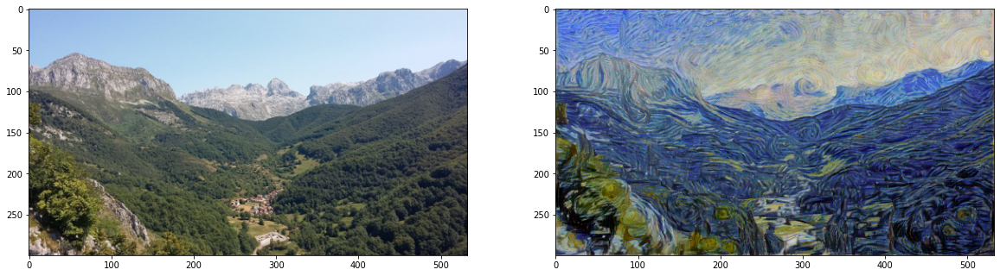

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))

## Primer parámetro modificado con:

1. Content_weight y style_weight de: [1 y 1e6]
2. Learning rate: 0.003.
3. Steps: 500.

In [ ]:
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e6  # beta

learning_rate = 0.003

steps = 500 # número de iteraciones

# definimos cada cuántas imágenes queremos hacer una visualización intermedia
show_every = 100

Pérdida total:  28379650.0


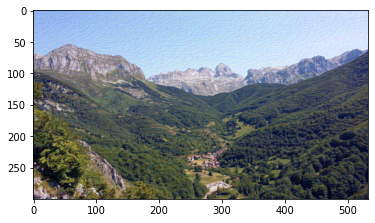

Pérdida total:  12880129.0


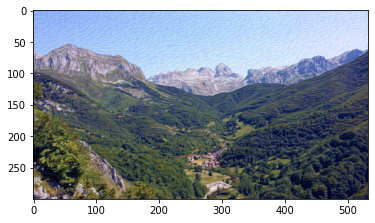

Pérdida total:  8306429.5


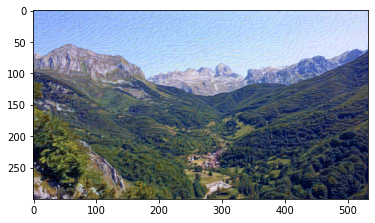

Pérdida total:  6418047.5


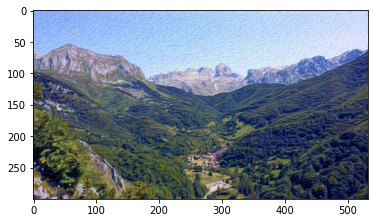

Pérdida total:  5203888.5


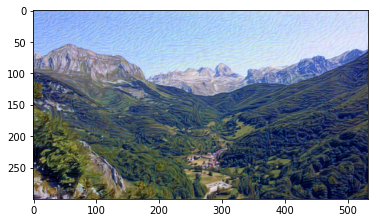

In [ ]:
# extraemos características de contenido y estilo de las imágenes originales
content_features = get_features(content, vgg_features)
style_features = get_features(style, vgg_features)

# calculamos la matriz gram de cada capa de estilo
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# creamos una tercera imagen "target" que se va a ir modificando
# La inicializamos con la imagen de contenido...
# ...y le vamos cambiando el estilo
target = content.clone().requires_grad_(True).to(device)

# definimos el optimizador sobre los parámetros de la imagen target
optimizer = optim.Adam([target], lr=learning_rate)

for ii in range(1, steps+1):
    
    # extraemos las características de la imagen generada
    target_features = get_features(target, vgg_features)
    
    # definimos la función de pérdida de contenido
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # definimos la función de pérdida de estilo como suma de la pérdida de cada capa
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        style_gram = style_grams[layer]
        # calculamos la "pérdida de estilo" de la capa actual y la ponderamos 
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # la añadimos a la pérdida de estilo
        style_loss += layer_style_loss / (d * h * w)
        
    # calculamos la pérdida total
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # actualizamos la imagen generada mediante el optimizador
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # mostramos las imágenes intermedias y su pérdida
    if  ii % show_every == 0:
        print('Pérdida total: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

## Veamos la imagen de contenido y la generada (final) con el primer parámetro

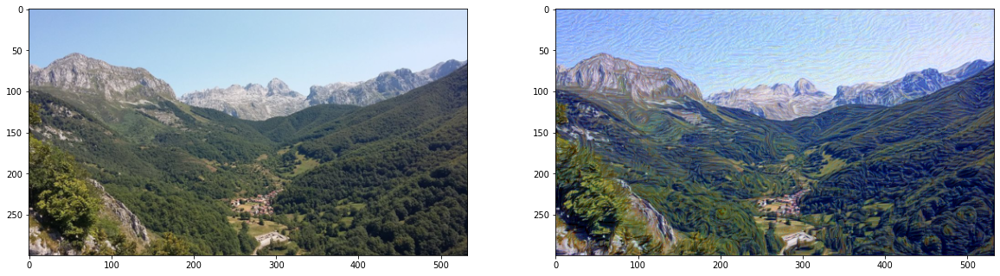

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))

## Segundo parámetro modificado con:

1. Content_weight y style_weight de: [1e2 y 1e2]
2. Learning rate: 0.01.
3. Steps: 1000.

In [ ]:
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1e2  # alpha
style_weight = 1e2  # beta

learning_rate = 0.01

steps = 1000 # número de iteraciones

# definimos cada cuántas imágenes queremos hacer una visualización intermedia
show_every = 100

Pérdida total:  1139.461181640625


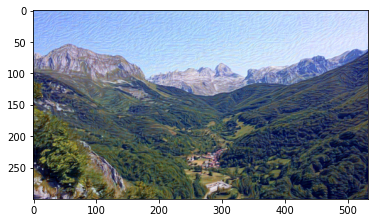

Pérdida total:  737.8665771484375


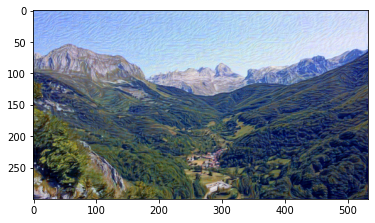

Pérdida total:  561.1024780273438


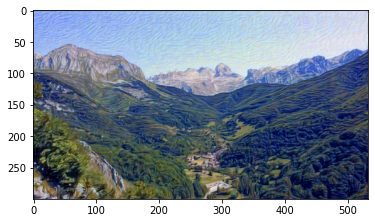

Pérdida total:  469.2017822265625


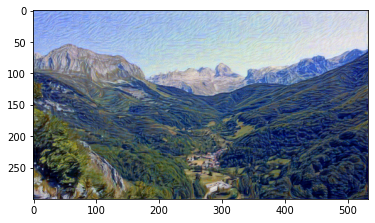

Pérdida total:  414.908935546875


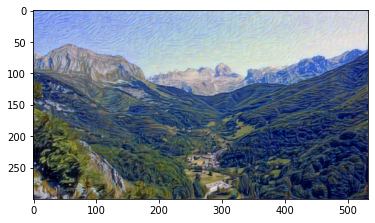

Pérdida total:  378.14752197265625


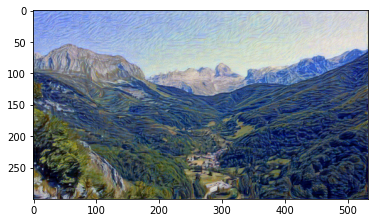

Pérdida total:  350.93658447265625


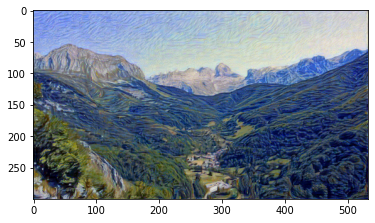

Pérdida total:  329.642822265625


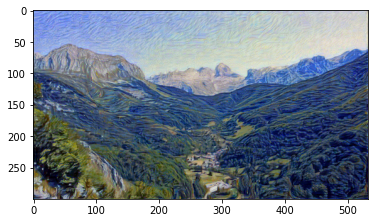

Pérdida total:  312.5206298828125


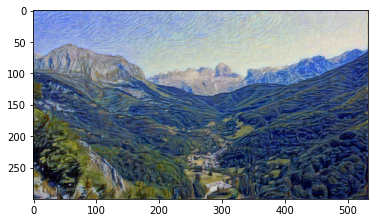

Pérdida total:  298.48345947265625


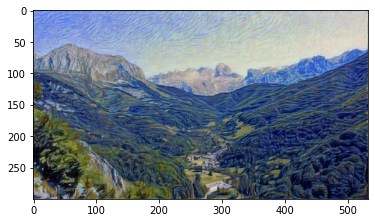

In [ ]:
# extraemos características de contenido y estilo de las imágenes originales
content_features = get_features(content, vgg_features)
style_features = get_features(style, vgg_features)

# calculamos la matriz gram de cada capa de estilo
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# creamos una tercera imagen "target" que se va a ir modificando
# La inicializamos con la imagen de contenido...
# ...y le vamos cambiando el estilo
target = content.clone().requires_grad_(True).to(device)

# definimos el optimizador sobre los parámetros de la imagen target
optimizer = optim.Adam([target], lr=learning_rate)

for ii in range(1, steps+1):
    
    # extraemos las características de la imagen generada
    target_features = get_features(target, vgg_features)
    
    # definimos la función de pérdida de contenido
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # definimos la función de pérdida de estilo como suma de la pérdida de cada capa
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        style_gram = style_grams[layer]
        # calculamos la "pérdida de estilo" de la capa actual y la ponderamos 
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # la añadimos a la pérdida de estilo
        style_loss += layer_style_loss / (d * h * w)
        
    # calculamos la pérdida total
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # actualizamos la imagen generada mediante el optimizador
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # mostramos las imágenes intermedias y su pérdida
    if  ii % show_every == 0:
        print('Pérdida total: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

## Veamos la imagen de contenido y la generada (final) con el segundo parámetro

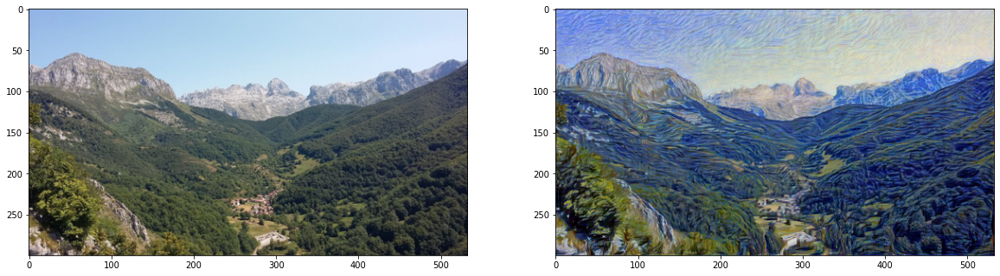

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))

## Tercer parámetro modificado con:

1. Content_weight y style_weight de: [1e2 y 1e-2]. 
2. Learning rate: 0.1.
3. Steps: 2000.

In [ ]:
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1e2  # alpha
style_weight = 1e-2  # beta

learning_rate = 0.1

steps = 2000 # número de iteraciones

# definimos cada cuántas imágenes queremos hacer una visualización intermedia
show_every = 100

Pérdida total:  6.043496131896973


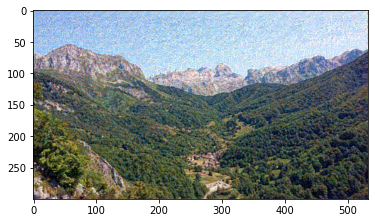

Pérdida total:  3.9828009605407715


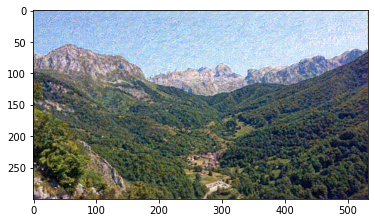

Pérdida total:  3.1973276138305664


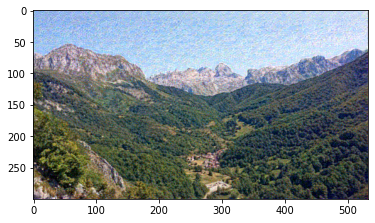

Pérdida total:  3.182018995285034


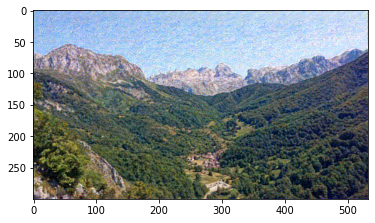

Pérdida total:  3.367241859436035


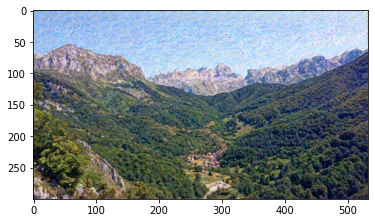

Pérdida total:  3.246674060821533


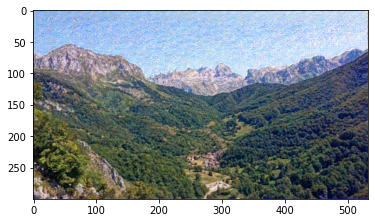

Pérdida total:  3.1992239952087402


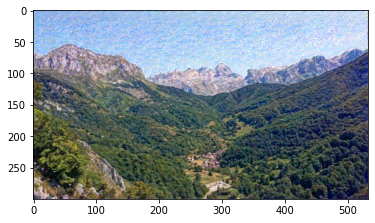

Pérdida total:  3.2438037395477295


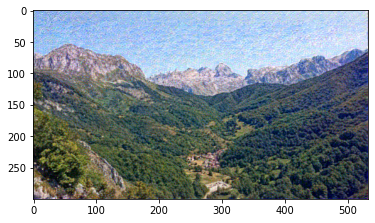

Pérdida total:  3.8979384899139404


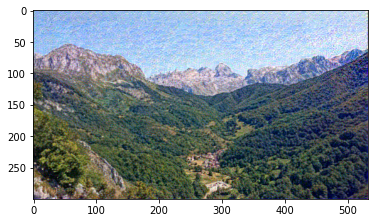

Pérdida total:  2.6634156703948975


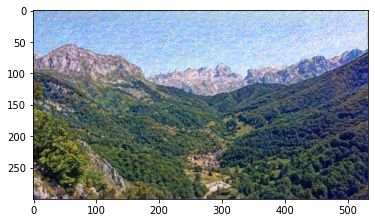

Pérdida total:  2.5618577003479004


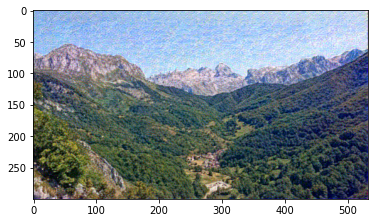

Pérdida total:  5.231079578399658


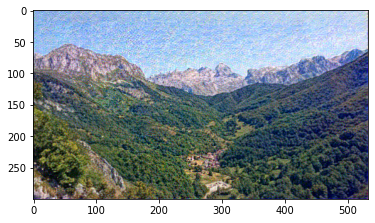

Pérdida total:  2.9418017864227295


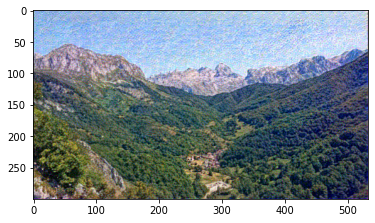

Pérdida total:  2.1458194255828857


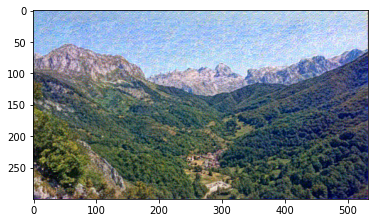

Pérdida total:  3.136469841003418


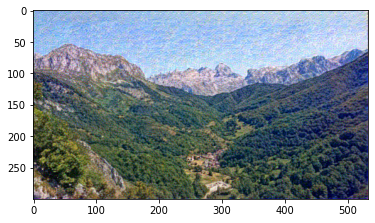

Pérdida total:  6.4342875480651855


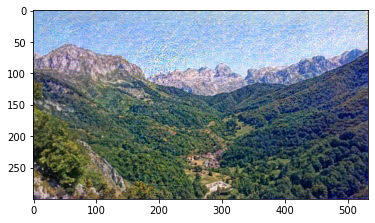

Pérdida total:  2.566471576690674


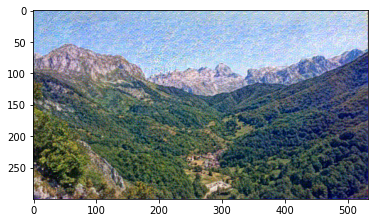

Pérdida total:  2.24419903755188


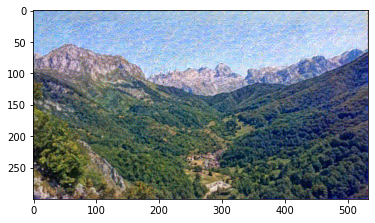

Pérdida total:  4.853446960449219


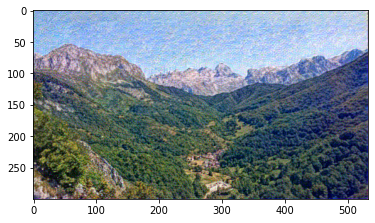

Pérdida total:  4.537294864654541


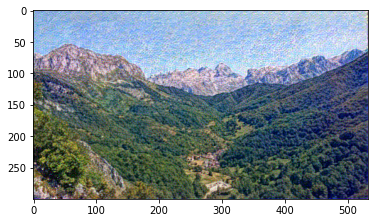

In [ ]:
# extraemos características de contenido y estilo de las imágenes originales
content_features = get_features(content, vgg_features)
style_features = get_features(style, vgg_features)

# calculamos la matriz gram de cada capa de estilo
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# creamos una tercera imagen "target" que se va a ir modificando
# La inicializamos con la imagen de contenido...
# ...y le vamos cambiando el estilo
target = content.clone().requires_grad_(True).to(device)

# definimos el optimizador sobre los parámetros de la imagen target
optimizer = optim.Adam([target], lr=learning_rate)

for ii in range(1, steps+1):
    
    # extraemos las características de la imagen generada
    target_features = get_features(target, vgg_features)
    
    # definimos la función de pérdida de contenido
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # definimos la función de pérdida de estilo como suma de la pérdida de cada capa
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        style_gram = style_grams[layer]
        # calculamos la "pérdida de estilo" de la capa actual y la ponderamos 
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # la añadimos a la pérdida de estilo
        style_loss += layer_style_loss / (d * h * w)
        
    # calculamos la pérdida total
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # actualizamos la imagen generada mediante el optimizador
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # mostramos las imágenes intermedias y su pérdida
    if  ii % show_every == 0:
        print('Pérdida total: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

## Veamos la imagen de contenido y la generada (final) con el tercer y último parámetro

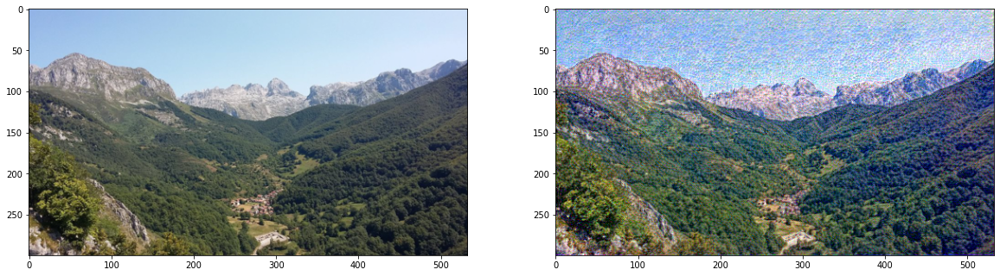

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(target))

## Almacenamiento en local
Por último, si queremos conservar la imagen resultante, podemos bajarla imagen a nuestro ordenador.

In [ ]:
from google.colab import files
target_path = "content_style.jpg"

target_im = im_convert(target)
target_im = target_im * 255
target_im = target_im.astype('uint8')
Image.fromarray(target_im).save(target_path) 

files.download(target_path)

# Preguntas
### 1 - ¿Cuántas capas lineales contiene el clasificador de VGG19

La cantidad de capas linelaes que hay presentes son 3 y son las siguientes: 

  1. (0): Linear(in_features=25088, out_features=4096, bias=True)
  2. (3): Linear(in_features=4096, out_features=4096, bias=True)
  3. (6): Linear(in_features=4096, out_features=1000, bias=True)

### 2 - ¿Cuántas clases distintas puede reconocer VGG19 en su configuración original?

Puede reconocer 1000 clases distintas y se definen a continuación:

Linear(in_features=4096, out_features=1000, bias=True)

### 3 - Indica los identificadores de capas convolucionales a continuación de capas de max pooling

Para este ejemplo específico se tienen 5 capas max pooling y se definen a continuación:

1. Para el primero: 
(4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False) **lo que le sigue es:**
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)), es decir una capa convolucional de 64 por 128. 

2. Para el segundo: 

  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False) **lo que le sigue es:**
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)), es decir una capa convolucional de 128 por 256. 

3. Para el tercero: 

  (18): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False) **lo que le sigue es:**
  (19): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)), es decir una capa convolucional de 256 por 512. 

4. Para el cuarto es: 
  (27): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False) **lo que le sigue es:**
  (28): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)), es decir una capa convolucional de 512 por 512.

5. Para el quinto es: 
  (36): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False) **y a este no le sigue ningún parámetro.**, es decir no hay ninguna capa convolucional.

### 4 - ¿Qué influencia tienen los cambios solicitados (content_weight, style_weight, learning rate, steps) en las imágenes intermedias y en la imagen resultante?

1. A nivel de la primera imagen (original) se ve que la transferencia de estilo es bastante notoria y la imagen original se ve bastante afectada por la imagen de Van Gogh con la que trabajé. 

2. Para la segunda imagen se ve que la transferencia de estilo es menos aparente y aunque sí se ve algo de transferencia de estilo no es tan evidente como en la imagen original. 

3. A nivel de la tercera imagen se ve un efecto suavizado sobre la imagen y los colores se ven con más realce y se ve claramente una transferencia de estilo muy parecida con la primer imagen (parámetros originales). 

4. Para la última imagen no se ve tanta transferencia de estilo sino que se ve como un efecto granular y no se ve como una transferencia de estilo tan notoria de la imagen de Van Gogh, eso sí la imagen final se ve con más realce de color que la original. 

Se puede decir que las principales diferencias son: cambios a nivel de color, en las imagenes se ve que los colores tienen más realce y son más vividas y si comparamos la imagen con los parámetros por defecto versus los cambios solicitados se puede observar que en la imagen por defecto había demasiada alusión a Van Gogh, es decir, se puede ver como la montaña parace que fue pintada por el mismo Van Gogh, mientras que las siguientes sí se ve el estilo, es decir, como si alguien se hubiese inspirado en esta pintura para hacer algo que recordara a la pintura (misma técnica como suavizada, redondeada, tipo ola de mar) hasta llegar a la última imagen que se ve que es más vivida pero que no recuerda tanto a Van Gogh. 